# ECE228 Project

### Group 18

#### Team members: 
- Junxian Qu
- Yifan Wang
- Zikuan Wang

## 1. Dataset

- We use the dataset from kaggle
- Link for download: https://www.kaggle.com/wkirgsn/electric-motor-temperature

- Understand the dataset. 
- Important features included in the dataset: 

- `u_q`: Voltage q-component measurement in dq-coordinates (in V)
- `u_d`: Voltage d-component measurement in dq-coordinates 
- `i_d`: Current d-component measurement in dq-coordinates
- `i_q`: Current q-component measurement in dq-coordinates

- `stator_tooth`: Stator tooth temperature (in °C) measured with thermocouples
- `stator_yoke`: Stator yoke temperature (in °C) measured with thermocouples
- `coolant`: Coolant temperature (in °C)

- `motor_speed`: Motor speed (in rpm)
- `pm`: Permanent magnet temperature (in °C) measured with thermocouples and transmitted wirelessly via
- `stator_winding`: Stator winding temperature (in °C) measured with thermocouples

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.utils import shuffle

# change to your local working directory
os.chdir('/Users/mclar/UCSD/Spring 2021')
df = pd.read_csv('./measures_v2.csv')
#os.chdir('/Users/Gorgeous/1_UCSD/6_Spring21/ECE228_ML/final_project/ece228-proj')

In [19]:
dat = df.drop(df[(abs(df['i_q'])<0.1) & (abs(df['i_d'])<0.1)].index)
dat.info()
# shuffle the data
dat = shuffle(dat)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1326558 entries, 5 to 1330815
Data columns (total 13 columns):
u_q               1326558 non-null float64
coolant           1326558 non-null float64
stator_winding    1326558 non-null float64
u_d               1326558 non-null float64
stator_tooth      1326558 non-null float64
motor_speed       1326558 non-null float64
i_d               1326558 non-null float64
i_q               1326558 non-null float64
pm                1326558 non-null float64
stator_yoke       1326558 non-null float64
ambient           1326558 non-null float64
torque            1326558 non-null float64
profile_id        1326558 non-null int64
dtypes: float64(12), int64(1)
memory usage: 141.7 MB


## 2. Exploratory Data Analysis (EDA)

### 2.1 Convert target `pm` feature to new feature : `pm_alarm`

In order to convert the simple regression problem to predict temperature to application level, we do statistical analysis and generate a target feature `pm_alarm`, which indicates risky status of significate high temperature. The feature `pm_alarm` is generated by $\mu + 2\sigma$ threshold as in our case of 1,330,816 samples (plot histgram below), we assume the distribution would be normal. 

In [21]:
dat_stat = dat.describe().round(1)
threshold = dat_stat.pm['mean'] + 2 * dat_stat.pm['std']
print('PM alarm threshold value:', threshold)

PM alarm threshold value: 96.5


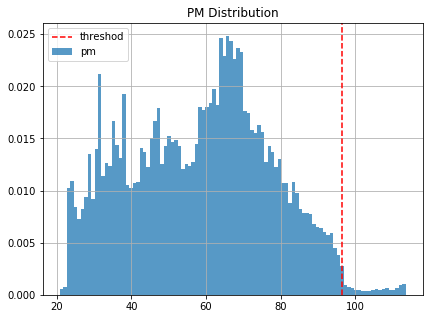

In [22]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)

# set the threshold at mean + 2 std
plt.hist(dat.pm, 100, density=True, alpha=0.75, label='pm')
plt.axvline(threshold, color='r', linestyle = '--', label='threshod')
plt.title('PM Distribution')
plt.legend()
plt.grid()

### Create a new feature `pm_alarm`

In [23]:
# label `pm_alarm` when the `pm` value higher than the threshold : mu + 2 * std 
# the threshold is 96.5 in this case

dat = dat.assign(pm_alarm = (dat.loc[:,'pm'] > threshold).astype(int) )
dat

## Checked. We have pm-alarm column as the label column

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id,pm_alarm
317174,-1.909728,19.363583,112.136009,-131.359207,79.405106,3499.953369,-234.644775,117.400848,74.233521,53.229450,26.374735,115.521614,6,0
700493,87.099068,72.022889,85.604620,-8.637119,79.100904,2019.080389,-9.579781,7.208741,79.016691,72.121730,27.916209,5.044617,68,0
660065,74.081496,89.468414,112.272222,90.416447,102.637973,2274.632066,-50.502569,-126.261277,87.434514,95.356917,24.894973,-98.887017,75,0
691887,59.521418,30.552468,92.545146,-115.836845,70.426662,3117.802394,-140.281056,112.065707,66.870812,52.924040,26.384509,100.943445,68,0
78359,27.731770,19.038958,104.791046,-128.068954,79.102692,4499.962891,-191.427261,82.974930,88.147614,54.192825,21.512192,79.509918,21,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1320501,128.680924,74.434591,57.407884,23.642457,55.859678,4818.977112,-92.964202,-17.632043,46.986025,58.387631,23.179272,-16.041109,71,0
960466,-0.630268,56.351025,120.491539,25.565328,94.861327,398.329566,-149.357702,-289.124569,77.033803,79.165351,27.427874,-242.514180,56,0
534911,93.748993,65.011078,82.084717,-83.572067,75.558197,2249.972168,-35.442066,114.409241,61.924858,70.527130,25.885130,84.285049,20,0
302617,-1.234260,18.229866,45.986229,1.430463,39.452328,0.003151,-1.999934,1.099505,70.705940,33.273624,27.456017,5.340698,6,0


## 3. Feature Engineering

### Perform feature engineering based on physics

In [24]:
# Calculate voltage u and current i(which decides the input power)
dat['u'] = np.sqrt( dat.u_q ** 2 + dat.u_d ** 2 )
dat['i'] = np.sqrt( dat.i_q ** 2 + dat.i_d ** 2 )

# Calculate power factor angle(which decides the input power efficiency)
dat['cos_theta'] = ( 2 * (dat.u_d * dat.i_d) / dat.u / dat.i )

# Calculate electric power(which correlated with voltage and current)
dat['electric_power'] = ( dat.u * dat.i * dat.cos_theta * 2 )

# Calculate mechanical power(which correlated with speed and torque)
dat['mechanic_power'] = ( dat.torque * dat.motor_speed / 9.55 )

# Calculate in-out rate (Represents efficiency. When mechanical power is positive, it is less than 100%. 
# When mechanical power is negative, this is larger than 100%. )
dat['inout'] = abs( dat.mechanic_power / dat.electric_power )

# replace inout rate which > 1 tobe 1
dat.loc[(dat['inout']>1), 'inout'] = 1

dat.dropna()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id,pm_alarm,u,i,cos_theta,electric_power,mechanic_power,inout
317174,-1.909728,19.363583,112.136009,-131.359207,79.405106,3499.953369,-234.644775,117.400848,74.233521,53.229450,26.374735,115.521614,6,0,131.373088,262.375932,1.788426,123291.006632,42337.200250,0.343392
700493,87.099068,72.022889,85.604620,-8.637119,79.100904,2019.080389,-9.579781,7.208741,79.016691,72.121730,27.916209,5.044617,68,0,87.526267,11.989085,0.157699,330.966857,1066.543076,1.000000
660065,74.081496,89.468414,112.272222,90.416447,102.637973,2274.632066,-50.502569,-126.261277,87.434514,95.356917,24.894973,-98.887017,75,0,116.889700,135.986836,-0.574537,-18265.051529,-23553.045060,1.000000
691887,59.521418,30.552468,92.545146,-115.836845,70.426662,3117.802394,-140.281056,112.065707,66.870812,52.924040,26.384509,100.943445,68,0,130.234303,179.548036,1.389856,64998.859667,32955.153302,0.507011
78359,27.731770,19.038958,104.791046,-128.068954,79.102692,4499.962891,-191.427261,82.974930,88.147614,54.192825,21.512192,79.509918,21,0,131.037049,208.636611,1.793465,98063.556872,37465.097528,0.382049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1320501,128.680924,74.434591,57.407884,23.642457,55.859678,4818.977112,-92.964202,-17.632043,46.986025,58.387631,23.179272,-16.041109,71,0,130.834804,94.621519,-0.355079,-8791.608596,-8094.422700,0.920699
960466,-0.630268,56.351025,120.491539,25.565328,94.861327,398.329566,-149.357702,-289.124569,77.033803,79.165351,27.427874,-242.514180,56,0,25.573096,325.423938,-0.917648,-15273.514620,-10115.242742,0.662273
534911,93.748993,65.011078,82.084717,-83.572067,75.558197,2249.972168,-35.442066,114.409241,61.924858,70.527130,25.885130,84.285049,20,0,125.591258,119.773179,0.393814,11847.866959,19857.488525,1.000000
302617,-1.234260,18.229866,45.986229,1.430463,39.452328,0.003151,-1.999934,1.099505,70.705940,33.273624,27.456017,5.340698,6,0,1.889344,2.282246,-1.326932,-11.443322,0.001762,0.000154


### 3.1 Handle Imbalance Dataset

The dataset is imbalance. The number of non-alarm cases is 1312242, while the number of alarm cases is 14316. 

However, the minority class (alarm cases) is what we care and the accuracy of the alarm case prediction is more important. So, the **synthetic sampling technique** is needed here. 

We perform the downsampling for the label "0" case and make it the same quantity as the label "1" case.

This is important in data science because the equal number of dataset can help the model perform evenly well on both cases.

In [25]:
# separate into 2 sets: non-alarm and alarm  

dat_non_alarm = dat[dat.pm_alarm == 0]
dat_alarm = dat[dat.pm_alarm == 1]

print("label 0 have",len(dat_non_alarm), "samples")
print("label 1 have", len(dat_alarm), "samples")

label 0 have 1312242 samples
label 1 have 14316 samples


In [28]:
### downsample non-alarm class
from sklearn.utils import shuffle

# 1. shuffle non-alarm set
dat_non_alarm_ori = shuffle(dat_non_alarm)
print('Original size of non-alarm set :', len(dat_non_alarm_ori ) )

# 2. pick the first 14316 rows from non-alarm set
dat_non_alarm = dat_non_alarm_ori[:len(dat_alarm)]
print('After downsampling, the size of non-alarm set :', len(dat_non_alarm ))

# 2. concate two sets, and shuffle again
df_bl = pd.concat([dat_non_alarm, dat_alarm], axis=0)
df_bl = shuffle(df_bl)

## Checked. we trim the label "0" the same as label "1"

Original size of non-alarm set : 14316
After downsampling, the size of non-alarm set : 14316


### 3.2 Statistics Summary

In [29]:
df_bl.describe().round(1)

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id,pm_alarm,u,i,cos_theta,electric_power,mechanic_power,inout
count,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0,28632.0
mean,40.1,28.9,91.6,-71.3,73.0,3732.0,-125.2,50.8,81.5,54.2,24.5,46.1,32.8,0.5,104.0,152.1,1.0,52401.9,19692.0,0.5
std,38.8,18.3,33.0,68.4,23.1,2189.4,79.0,70.9,27.0,15.8,1.8,60.4,20.1,0.5,45.5,79.9,1.1,51158.5,19884.7,0.3
min,-15.4,15.0,18.9,-131.4,18.3,-0.0,-264.1,-288.5,21.3,18.3,16.8,-242.1,2.0,0.0,0.0,0.2,-1.9,-113959.7,-52466.0,0.0
25%,9.8,19.0,64.9,-129.3,55.9,1500.0,-197.7,1.2,60.2,45.6,23.2,0.5,20.0,0.0,89.2,98.7,0.1,543.1,7.0,0.3
50%,24.5,19.4,104.8,-115.4,84.8,4999.9,-162.8,61.9,96.5,58.4,24.7,58.2,24.0,0.5,130.1,193.0,1.5,68062.0,31073.5,0.4
75%,58.2,29.2,119.8,-5.4,90.6,5500.0,-45.4,66.2,105.2,61.5,25.8,64.4,44.0,1.0,130.7,211.9,1.9,102137.8,36571.5,0.7
max,132.1,93.5,138.9,131.4,111.1,6000.0,-0.1,301.7,113.6,100.9,30.7,260.9,81.0,1.0,133.7,361.5,1.9,137487.0,49527.6,1.0


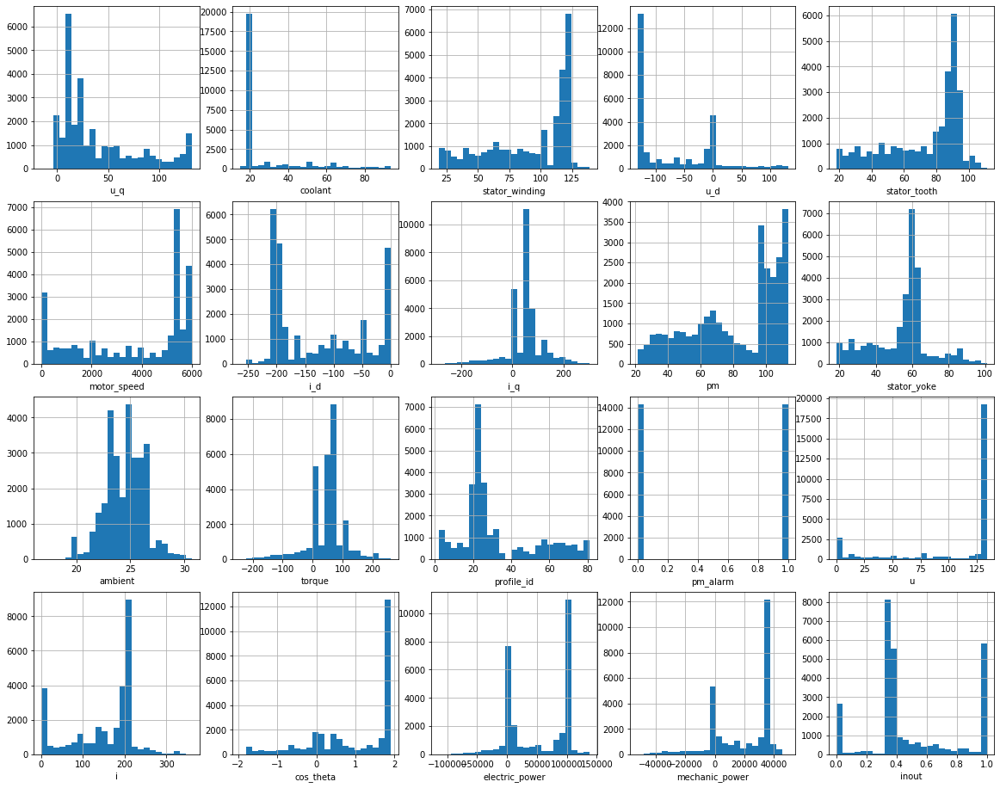

In [31]:
plt.figure(figsize=(20, 16))

idx = 0
for feat in df_bl.columns:
    idx += 1
    plt.subplot(4, 5, idx)
    plt.hist(df_bl[feat].astype(float), bins=25)
    plt.xlabel(feat)
    plt.grid()
        
plt.show()

# save to csv file, we will use it later 
df_bl.to_csv('./df_bl.csv')

## 4. Modeling 
### 4.1 Data Preparation

- Classification Problem: make Prediction on PM_alarm
- The prediction can only be either "1" or "0"
- "1" means showing warning on the dashboard and "0" means showing normal on the dashboard
- Remove `pm` and `profile_id`, they are not the part of input


In [32]:
# The directory where the csv file saved 
df_bl = pd.read_csv('./df_bl.csv')

# Remove the unnecessary columns
rm_cols = ['Unnamed: 0', 'pm', 'profile_id'] # 'pm', 
for col in rm_cols:
    if col in df_bl.columns:
        df_bl = df_bl.drop(columns = [col])
        print(f'Removed {col}')

Removed Unnamed: 0
Removed pm
Removed profile_id


### 4.2 Split Dataset and Scaling 

In [34]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df_bl, test_size=0.3, shuffle=True)

y_train = train[['pm_alarm']]
x_train = train.drop(columns=['pm_alarm'])

y_test = test[['pm_alarm']]
x_test = test.drop(columns=['pm_alarm'])

In [35]:
x_train.describe().round(1)

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,stator_yoke,ambient,torque,u,i,cos_theta,electric_power,mechanic_power,inout
count,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0,20042.0
mean,40.1,28.7,91.7,-71.5,73.0,3743.7,-125.4,50.9,54.2,24.5,46.2,104.1,152.1,1.0,52470.0,19724.9,0.5
std,38.8,18.1,33.0,68.3,23.2,2189.5,78.9,70.4,15.8,1.8,60.0,45.4,79.8,1.1,51161.5,19856.9,0.3
min,-15.4,15.0,18.9,-131.4,18.3,-0.0,-264.1,-288.5,18.3,16.8,-242.1,0.0,0.2,-1.9,-113959.7,-52466.0,0.0
25%,9.8,19.0,65.1,-129.3,55.9,1500.0,-197.7,1.2,45.6,23.2,0.5,89.3,98.9,0.1,549.7,8.6,0.3
50%,24.5,19.4,104.8,-115.7,84.9,5000.0,-164.5,61.9,58.4,24.7,58.2,130.1,193.0,1.5,70019.9,31073.8,0.4
75%,57.8,29.0,119.8,-5.4,90.6,5500.0,-45.8,66.2,61.5,25.8,64.4,130.7,211.8,1.9,102139.1,36567.8,0.7
max,132.1,93.5,138.6,131.4,111.0,6000.0,-0.1,301.7,100.9,30.7,260.9,133.7,361.5,1.9,137487.0,49527.6,1.0


In [36]:
# scale the data
def MinMax_Scaler(x):
    min_x = x.min()
    range_x = (x - min_x).max()
    x_scaled = (x - min_x) / range_x
    return x_scaled

x_train = MinMax_Scaler(x_train)
x_test = MinMax_Scaler(x_test)

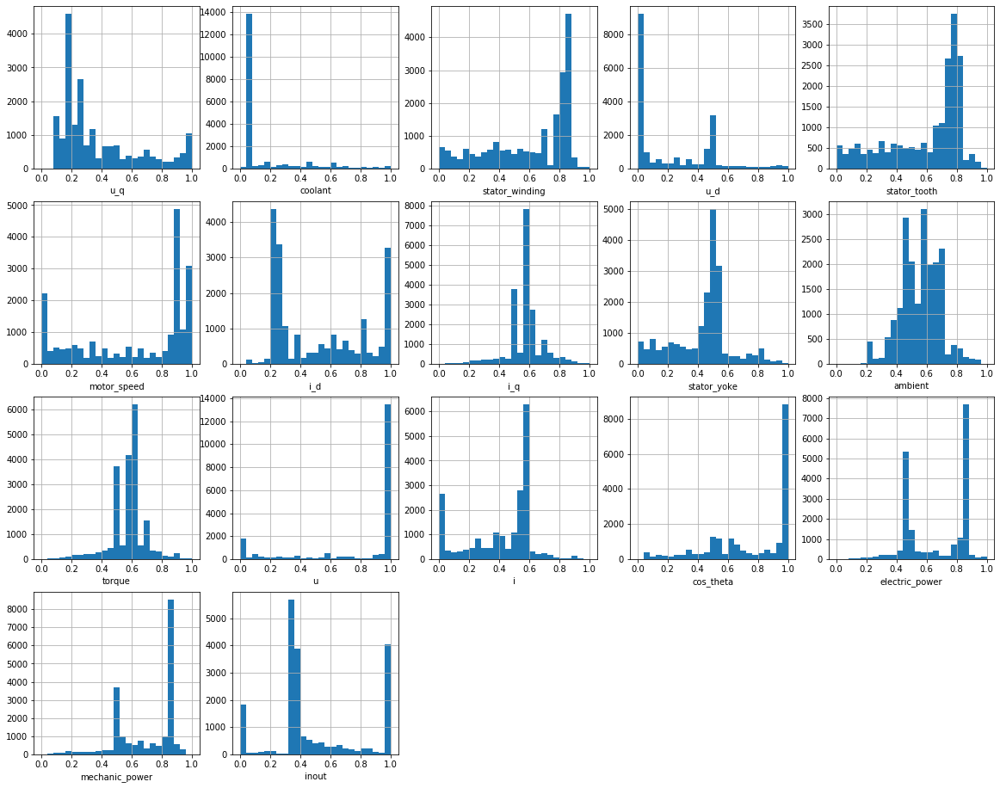

In [37]:
# show distributions of the features
plt.figure(figsize=(20, 16))

idx = 0
for feat in x_train.columns:
    idx += 1
    plt.subplot(4, 5, idx)
    plt.hist(x_train[feat].astype(float), bins=25)
    plt.xlabel(feat)
    plt.grid()
        
plt.show()

### 4.3 Modeling - Cross-Validation (RF, GBoost, AdaBoost)

### Cross-Validation for Random Forest

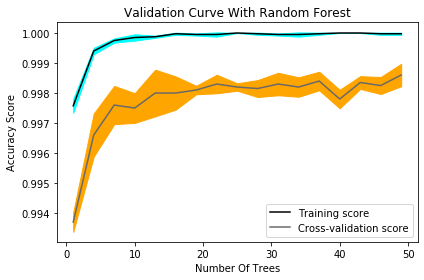

Time: 10.0485


In [39]:
from numpy import loadtxt
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.ensemble  import AdaBoostClassifier,GradientBoostingClassifier,RandomForestClassifier
from sklearn.svm import SVC 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier

import timeit
start = timeit.default_timer()

# Valid-Cross selected number of trees

from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import validation_curve
# Create range of values for parameter
param_range = np.arange(1, 50, 3)

# Calculate accuracy on training and test set using range of parameter values
train_scores, test_scores = validation_curve(RandomForestClassifier(), 
                                             x_train, 
                                             y_train.values.ravel() , 
                                             param_name="n_estimators", 
                                             param_range=param_range,
                                             cv=3, 
                                             scoring="accuracy", 
                                             n_jobs=-1)

# Calculate mean and standard deviation for training set scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

# Calculate mean and standard deviation for test set scores
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot mean accuracy scores for training and test sets
plt.plot(param_range, train_mean, label="Training score", color="black")
plt.plot(param_range, test_mean, label="Cross-validation score", color="dimgrey")

# Plot accurancy bands for training and test sets
plt.fill_between(param_range, train_mean - train_std, train_mean + train_std, color="cyan")
plt.fill_between(param_range, test_mean - test_std, test_mean + test_std, color="orange")

# Create plot
plt.title("Validation Curve With Random Forest")
plt.xlabel("Number Of Trees")
plt.ylabel("Accuracy Score")
plt.tight_layout()
plt.legend(loc="best")
plt.show()

stop = timeit.default_timer()
print('Time:', round(stop - start, 4))

### Cross-Validation for Gradient Boosting Classifier

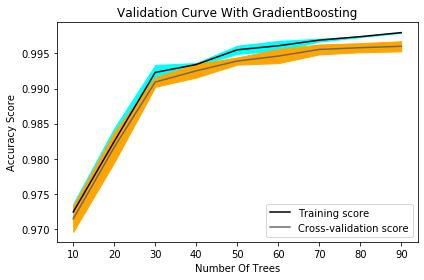

Time: 4.8498


In [40]:
import timeit
start = timeit.default_timer()

# Valid-Cross selected number of trees

from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import validation_curve
# Create range of values for parameter
param_range = np.arange(10, 100, 10)

# Calculate accuracy on training and test set using range of parameter values
train_scores, test_scores = validation_curve(GradientBoostingClassifier(), 
                                             x_train, 
                                             y_train.values.ravel() , 
                                             param_name="n_estimators", 
                                             param_range=param_range,
                                             cv=3, 
                                             scoring="accuracy", 
                                             n_jobs=-1)

# Calculate mean and standard deviation for training set scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

# Calculate mean and standard deviation for test set scores
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot mean accuracy scores for training and test sets
plt.plot(param_range, train_mean, label="Training score", color="black")
plt.plot(param_range, test_mean, label="Cross-validation score", color="dimgrey")

# Plot accurancy bands for training and test sets
plt.fill_between(param_range, train_mean - train_std, train_mean + train_std, color="cyan")
plt.fill_between(param_range, test_mean - test_std, test_mean + test_std, color="orange")

# Create plot
plt.title("Validation Curve With GradientBoosting")
plt.xlabel("Number Of Trees")
plt.ylabel("Accuracy Score")
plt.tight_layout()
plt.legend(loc="best")
plt.show()

stop = timeit.default_timer()
print('Time:', round(stop - start, 4))

### Cross-Validation for AdaBoost Classifier

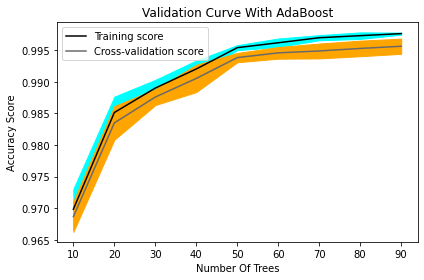

Time: 39.0059


In [236]:
import timeit
start = timeit.default_timer()

# Valid-Cross selected number of trees

from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import validation_curve

# Create range of values for parameter
param_range = np.arange(10, 100, 10)

# Calculate accuracy on training and test set using range of parameter values
train_scores, test_scores = validation_curve(AdaBoostClassifier(), 
                                             x_train, 
                                             y_train.values.ravel() , 
                                             param_name="n_estimators", 
                                             param_range=param_range,
                                             cv=3, 
                                             scoring="accuracy", 
                                             n_jobs=-1)

# Calculate mean and standard deviation for training set scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)

# Calculate mean and standard deviation for test set scores
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot mean accuracy scores for training and test sets
plt.plot(param_range, train_mean, label="Training score", color="black")
plt.plot(param_range, test_mean, label="Cross-validation score", color="dimgrey")

# Plot accurancy bands for training and test sets
plt.fill_between(param_range, train_mean - train_std, train_mean + train_std, color="cyan")
plt.fill_between(param_range, test_mean - test_std, test_mean + test_std, color="orange")

# Create plot
plt.title("Validation Curve With AdaBoost")
plt.xlabel("Number Of Trees")
plt.ylabel("Accuracy Score")
plt.tight_layout()
plt.legend(loc="best")
plt.show()

stop = timeit.default_timer()
print('Time:', round(stop - start, 4))

### 4.4 Modeling - Train / Predication / Evaluation Metrics

- Based on the cross-validation, we select the optimum number of trees to achieve the decent accuracy score.
- We selected RF (n=15), GBoost (n=50), AdaBoost (n=50)

In [66]:
n_rf = 15
n_gbt = 50
n_ada = 50

Running Randomforest
Running AdaBoost
Running Gradient Boosting


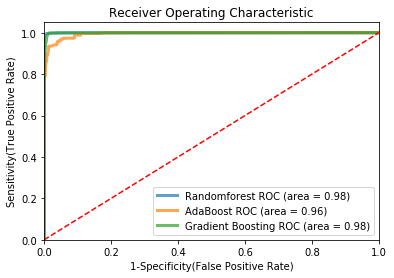

Time: 3.8295


In [67]:
from numpy import loadtxt
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.svm import SVC 
from sklearn.neighbors import KNeighborsClassifier

import timeit
start = timeit.default_timer()

plt.figure()

lr = 0.1

# Add the models to the list that you want to view on the ROC plot
# We plotted SGD and KNN plot as comparison to three tree based models we are focusing on.

models = [
{
    'label': 'Randomforest',
    'model': RandomForestClassifier(bootstrap=True, criterion='entropy', n_estimators=n_rf),        
}, 
{
    'label': 'AdaBoost',
    'model': AdaBoostClassifier(base_estimator=None, n_estimators=n_ada, 
                                learning_rate=lr, algorithm='SAMME.R', random_state=None), 
},
{
    'label': 'Gradient Boosting',
    'model': GradientBoostingClassifier(loss='deviance', learning_rate=lr, n_estimators=n_gbt)
}]

res_metrics = pd.DataFrame()

# Below for loop iterates through your models list
for m in models:
    print('Running', m['label'])
    model = m['model'] # select the model
    model.fit(x_train, y_train.values.ravel() ) # train the model
    y_pred = model.predict(x_test) # predict the test data
    
    # Compute False postive rate, and True positive rate
    fpr, tpr, thresholds = metrics.roc_curve(y_test, model.predict_proba(x_test)[:,1])
    
    # Calculate Area under the curve to display on the plot
    roc_auc = metrics.roc_auc_score(y_test, y_pred)
    
    # Now, plot the computed values
    plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (m['label'], roc_auc), linewidth=3, alpha=0.7)
    
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    model_results = pd.DataFrame([[m['label'], acc, prec, rec, f1, roc_auc]], 
                                 columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score','ROC'])
    res_metrics = res_metrics.append(model_results, sort=True)
    
# Custom settings for the plot 
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('1-Specificity(False Positive Rate)')
plt.ylabel('Sensitivity(True Positive Rate)')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

stop = timeit.default_timer()
print('Time:', round(stop - start, 4))

In [68]:
res_metrics[['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC']]

,Model,Accuracy,Precision,Recall,F1 Score,ROC
0,Randomforest,0.983586,0.999022,0.967566,0.983043,0.983325
0,AdaBoost,0.955879,0.973639,0.935606,0.954244,0.955549
0,Gradient Boosting,0.985099,0.992071,0.977509,0.984736,0.984976


## 5 Visualization & Interpretable ML
### 5.1 Extract the feature importance and plot big tree for the model 
Find the most important feature and plot the tree for the model

In [243]:
# Extract feature importances
fi = pd.DataFrame({'feature': list(x_train.columns),
                   'importance': model.feature_importances_}).sort_values('importance', ascending = False)

fi.head()

,feature,importance
13,cos_theta,0.342932
2,stator_winding,0.129514
3,u_d,0.094032
4,stator_tooth,0.086094
14,electric_power,0.059426


In [61]:
import timeit
start = timeit.default_timer()
from sklearn.ensemble import RandomForestClassifier

# Actual class predictions
rf_predictions = model.predict(x_test)
# Probabilities for each class
rf_probs = model.predict_proba(x_test)[:, 1]
# Train
# model.fit(iris.data, iris.target)
# Extract single tree
estimator = model.estimators_[2] #5

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = x_train.columns, 
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'rftree.png', '-Gdpi=400'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'rftree.png')

stop = timeit.default_timer()
print('Time:', round(stop - start), 4)

In [54]:
from sklearn.tree import export_graphviz
# train an XGBoost model
xg_model = GradientBoostingClassifier().fit(x_train, y_train) #xgboost.XGBRegressor().fit(x_train, y_train)

# make predictions
predictions = xg_model.predict(x_test)

image = xgboost.to_graphviz(xg_model)

#Set a different dpi (work only if format == 'png')
image.graph_attr = {'dpi':'400'}

image.render('xgtree', format = 'png')


'xgtree.png.png'

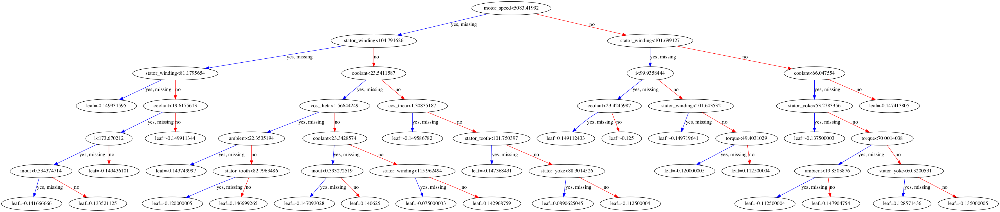

In [56]:
from IPython.display import Image
Image(filename = 'xgtree.png')

### 5.2 SHAP(SHapley Additive exPlanations)

The traditional way to analysis the model may not working well on tree based models due to the complexity of the tree and vague representation of the feature importance. Therefore, we decided to use SHAP as a new way to interprete the tree based models.

In [45]:
# Install xgboost and shap
import xgboost
import shap
shap.initjs()

In [47]:
# interprete the model's predictions using SHAP, we take the Random forest model as an example here
model = models[0]['model']
explainer = shap.Explainer(model)
shap_values = explainer(x_train)
shap_values = shap_values[:, :, 0]
shap_values.shape

(20042, 17)

In [48]:
shap_values[0]

.values =
array([ 0.00909617, -0.0359932 , -0.08911329, -0.01813759, -0.02166814,
       -0.06200783, -0.01276871, -0.00777031, -0.04862455, -0.00091018,
       -0.00469922,  0.00265012,  0.01003047, -0.15429452, -0.0694249 ,
        0.00585751,  0.0025548 ])

.base_values =
0.4952233642683698

.data =
array([0.27379998, 0.04855789, 0.81462096, 0.01347194, 0.75746297,
       0.97499647, 0.27562052, 0.59006515, 0.48951871, 0.53677558,
       0.5965411 , 0.97436366, 0.55432341, 0.99325365, 0.84249951,
       0.86261524, 0.36282981])

#### 5.2.1 The global interpretation of the features. 

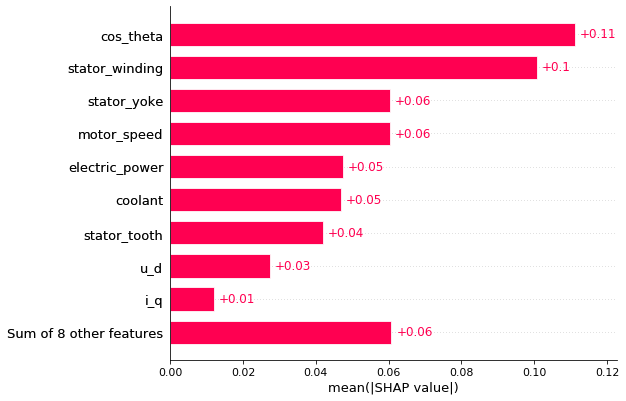

In [49]:
shap.plots.bar(shap_values)

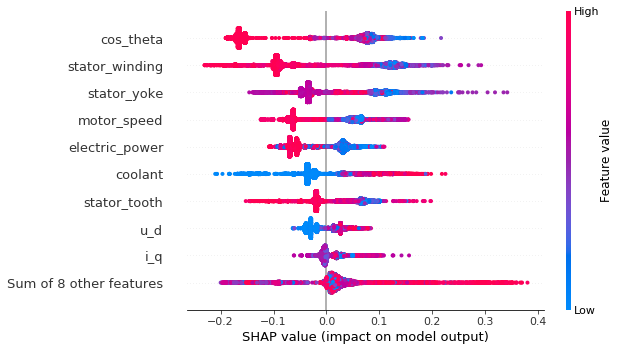

In [50]:
shap.plots.beeswarm(shap_values)

#### 5.2.2 The individual feature interpreatations. 

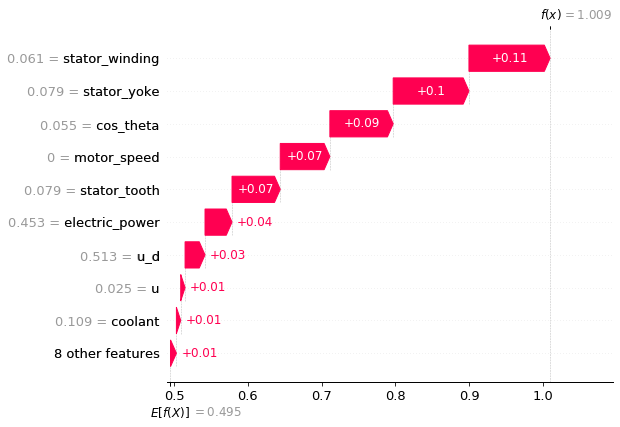

In [65]:
# We pick out one of the cases to take a look at the feature impact on the output specifically 
idx = 970 # sample 28000
shap.plots.waterfall(shap_values[idx])
shap.plots.force(shap_values[idx])

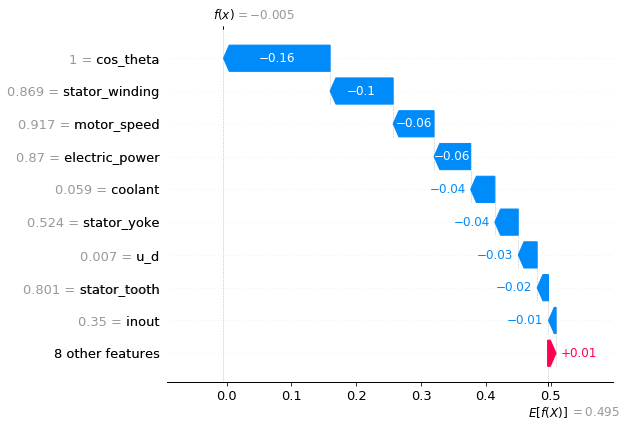

In [59]:
idx = 10
shap.plots.waterfall(shap_values[idx])
shap.plots.force(shap_values[idx])

#### 5.2.3 Feature interactions

In [51]:
x_train.columns

Index(['u_q', 'coolant', 'stator_winding', 'u_d', 'stator_tooth',
       'motor_speed', 'i_d', 'i_q', 'stator_yoke', 'ambient', 'torque', 'u',
       'i', 'cos_theta', 'electric_power', 'mechanic_power', 'inout'],
      dtype='object')

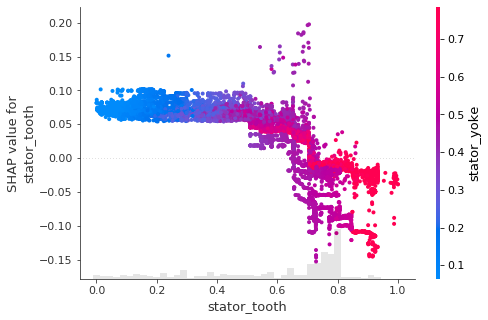

In [52]:
shap.plots.scatter(shap_values[:, 'stator_tooth'], color=shap_values[:, 'stator_yoke'])
# The smooth color transition means the stronger correlation in between the features

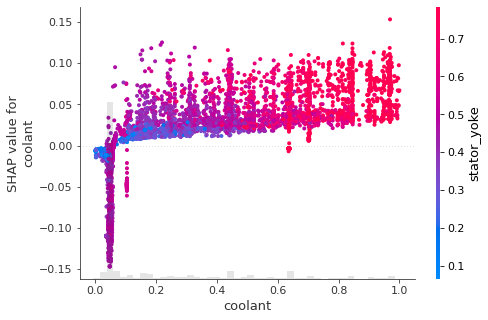

In [189]:
shap.plots.scatter(shap_values[:, 'coolant'], color=shap_values[:, 'stator_yoke']) 

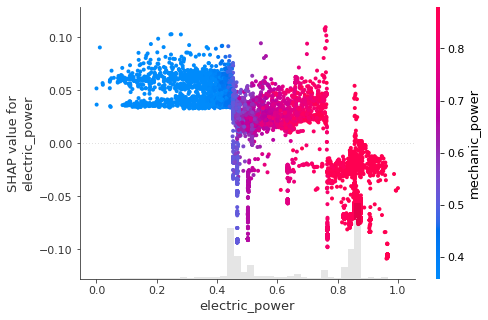

In [55]:
shap.plots.scatter(shap_values[:, 'electric_power'], color=shap_values[:, 'mechanic_power']) 

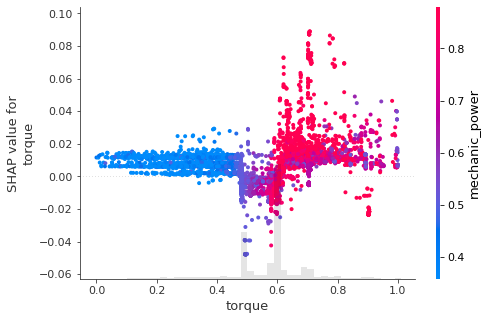

In [56]:
shap.plots.scatter(shap_values[:, 'torque'], color=shap_values[:, 'mechanic_power']) 

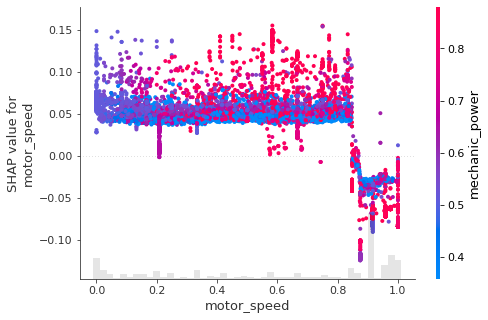

In [57]:
shap.plots.scatter(shap_values[:, 'motor_speed'], color=shap_values[:, 'mechanic_power']) 

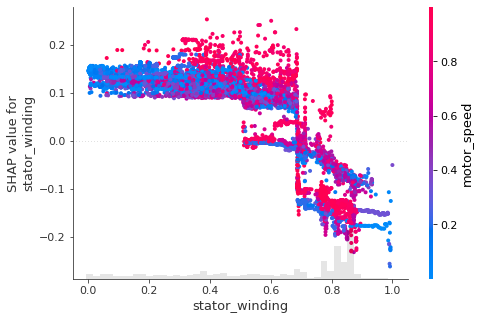

In [190]:
shap.plots.scatter(shap_values[:,'stator_winding'], color=shap_values[:, 'motor_speed'])

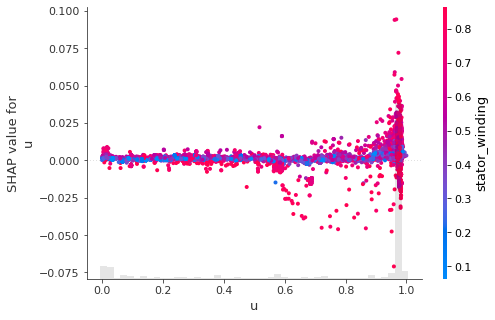

In [191]:
shap.plots.scatter(shap_values[:, 'u'], color=shap_values[:, 'stator_winding'])

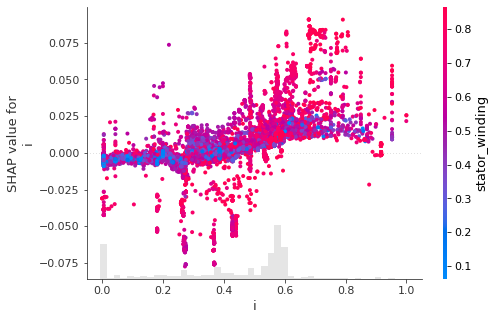

In [192]:
shap.plots.scatter(shap_values[:, 'i'], color=shap_values[:, 'stator_winding'])

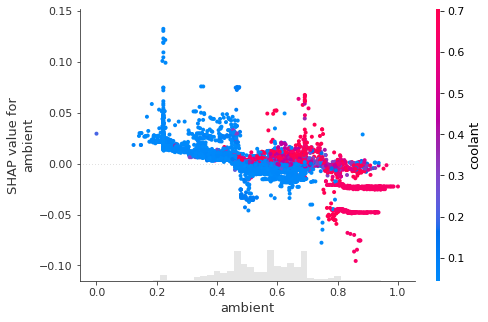

In [54]:
shap.plots.scatter(shap_values[:, 'ambient'], color=shap_values[:, 'coolant'])

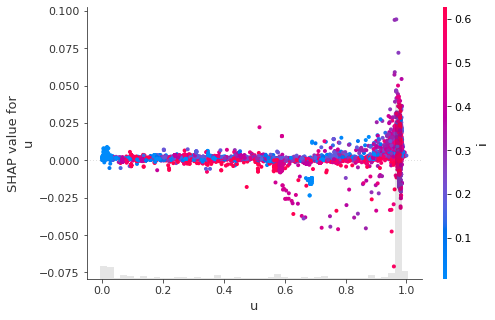

In [193]:
shap.plots.scatter(shap_values[:, 'u'], color=shap_values[:, 'i'])

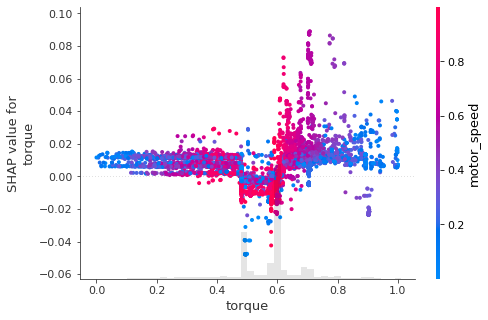

In [53]:
shap.plots.scatter(shap_values[:, 'torque'], color=shap_values[:, 'motor_speed'])

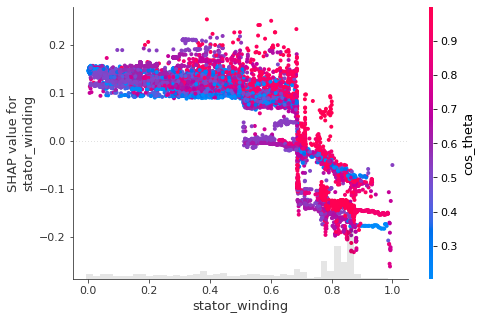

In [197]:
shap.plots.scatter(shap_values[:, 'stator_winding'], color=shap_values[:, 'cos_theta'])